In [1]:
from scipy.io import mmread
import pandas as pd
import numpy as np
from scipy.sparse import csr_matrix

# 1. Load the matrix
matrix = mmread("matrix.mtx").tocsc()  # Use .tocsc() or .tocsr() for efficient slicing

# 2. Load genes or features
# Try both 'genes.tsv' or 'features.tsv' depending on your version of Cell Ranger
try:
    genes = pd.read_csv("genes.tsv", header=None, sep="\t")
except FileNotFoundError:
    genes = pd.read_csv("features.tsv", header=None, sep="\t")

# 3. Load barcodes
barcodes = pd.read_csv("barcodes.tsv", header=None)

# 4. Rename for convenience
gene_names = genes.iloc[:, 1].values  # Column 1 = gene names
cell_barcodes = barcodes.iloc[:, 0].values  # Column 0 = barcode strings

# 5. Convert sparse matrix to dense (if manageable) and create DataFrame
# WARNING: Dense conversion is memory-intensive; only do this if matrix is small enough
df = pd.DataFrame.sparse.from_spmatrix(matrix.T, index=cell_barcodes, columns=gene_names)


# Optional: convert to dense DataFrame (memory intensive)
# df_dense = df.sparse.to_dense()

# Show the shape and head
print(f"Shape: {df.shape}")  # (num_cells, num_genes)
print(df.head())


Shape: (1421, 10928)
                          Mrpl15  Lypla1  Tcea1  Atp6v1h  Rb1cc1  Pcmtd1  \
DVFL1_AAACCTGAGCCAGAAC-1       1       0      2        0       0       0   
DVFL1_AAACCTGAGCCAGTAG-1       3       1      1        1       0       1   
DVFL1_AAACGGGAGCGATCCC-1       3       1      0        1       2       1   
DVFL1_AAACGGGAGCTAAGAT-1       2       4      1        1       0       5   
DVFL1_AAACGGGTCTCTTGAT-1       3       5      1        3       1       0   

                          Rrs1  Vcpip1  Sgk3  Snhg6  ...  mt-Nd3  mt-Nd4l  \
DVFL1_AAACCTGAGCCAGAAC-1     1       1     1      0  ...       1        5   
DVFL1_AAACCTGAGCCAGTAG-1     7       2     1      1  ...       9        5   
DVFL1_AAACGGGAGCGATCCC-1     2       0     0      1  ...       2        2   
DVFL1_AAACGGGAGCTAAGAT-1     7       1     2      1  ...       2        5   
DVFL1_AAACGGGTCTCTTGAT-1     4       0     1      0  ...       7        3   

                          mt-Nd4  mt-Nd5  mt-Nd6  mt-Cytb  

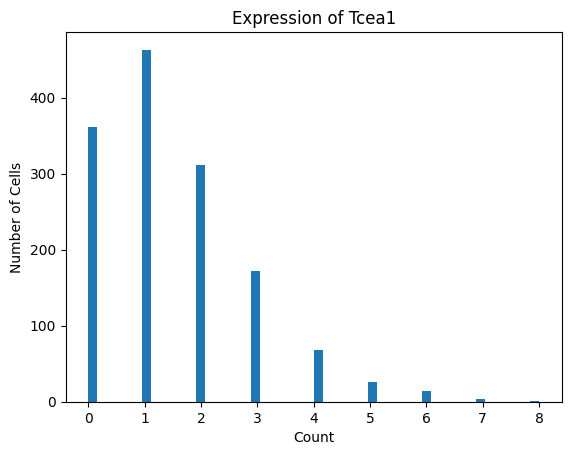

In [2]:
import matplotlib.pyplot as plt

gene = "Tcea1"  # Replace with a gene in your dataset

if gene in df.columns:
    plt.hist(df[gene].astype(float), bins=50)
    plt.title(f"Expression of {gene}")
    plt.xlabel("Count")
    plt.ylabel("Number of Cells")
    plt.show()
else:
    print(f"Gene {gene} not found in dataset.")

In [3]:
from scipy.io import mmread
import numpy as np

# Load sparse matrix
mtx = mmread("matrix.mtx")

# Convert to dense NumPy array if small
dense_mtx = mtx.toarray()

# View first few rows
print(dense_mtx)

[[1 3 3 ... 2 4 5]
 [0 1 1 ... 0 1 2]
 [2 1 0 ... 0 4 0]
 ...
 [0 0 0 ... 0 0 1]
 [0 0 0 ... 0 0 1]
 [0 0 0 ... 0 1 1]]


✅ Loaded data: (1421, 10928) (cells, genes)


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


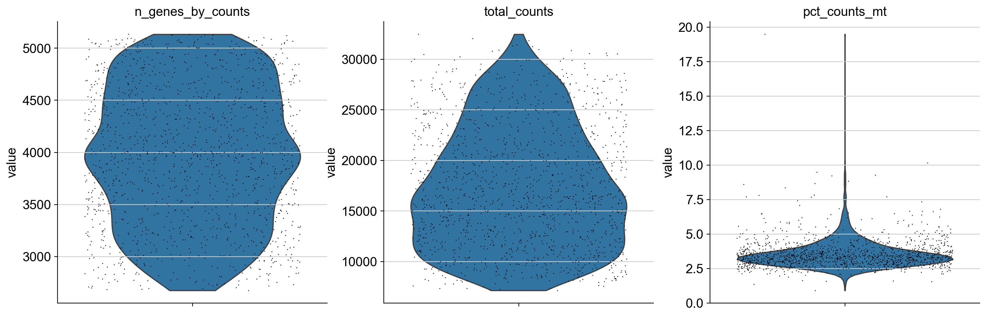

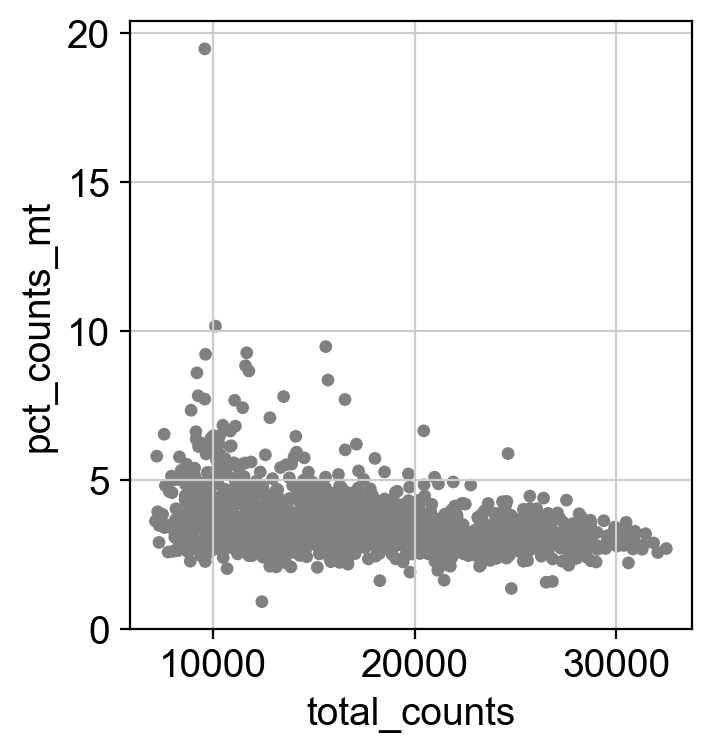

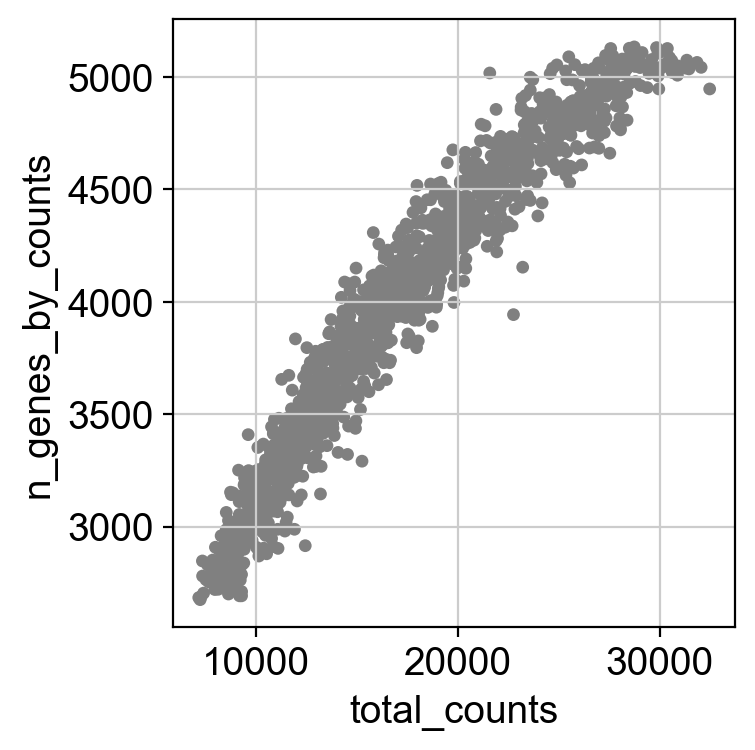

🔎 Before filtering: (1421, 10927)
✅ After filtering: (1421, 10927)


/Users/boabangfrancis/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:269: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/Users/boabangfrancis/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_scale.py:309: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/Users/boabangfrancis/anaconda3/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


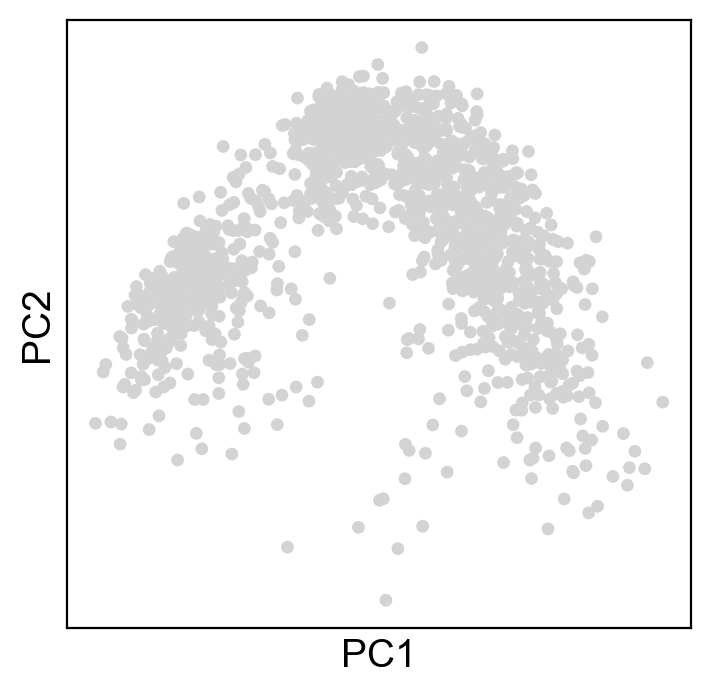

/var/folders/ql/5nmrkn3145n9_pzr7h7w7_gh0000gn/T/ipykernel_25637/3277892862.py:68: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=0.5)


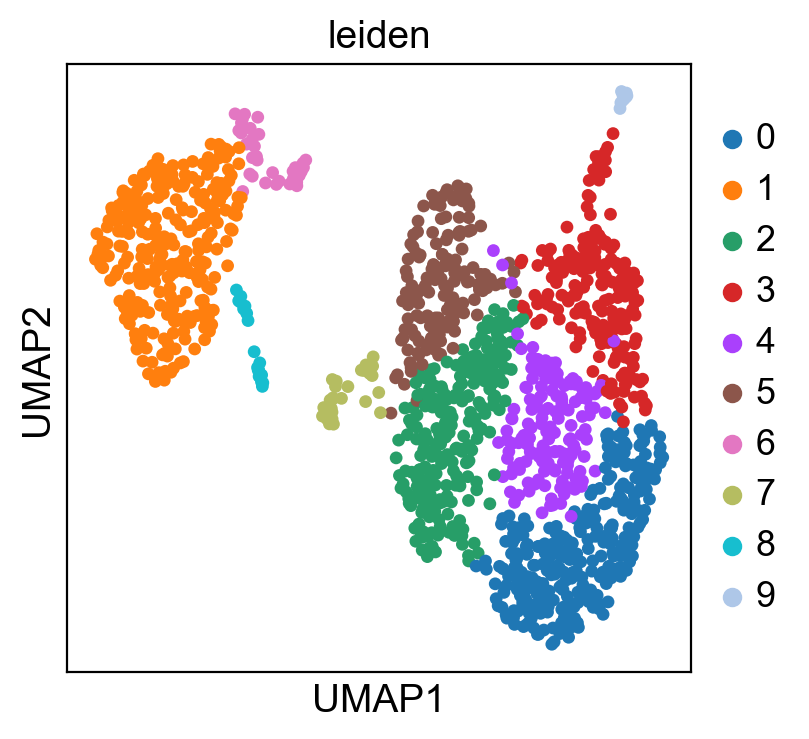

/Users/boabangfrancis/anaconda3/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:482: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/Users/boabangfrancis/anaconda3/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:482: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/Users/boabangfrancis/anaconda3/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:482: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/Users/boabangfrancis/anaconda3/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:482: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/Users/boabangfrancis/anaconda3/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:482: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "log

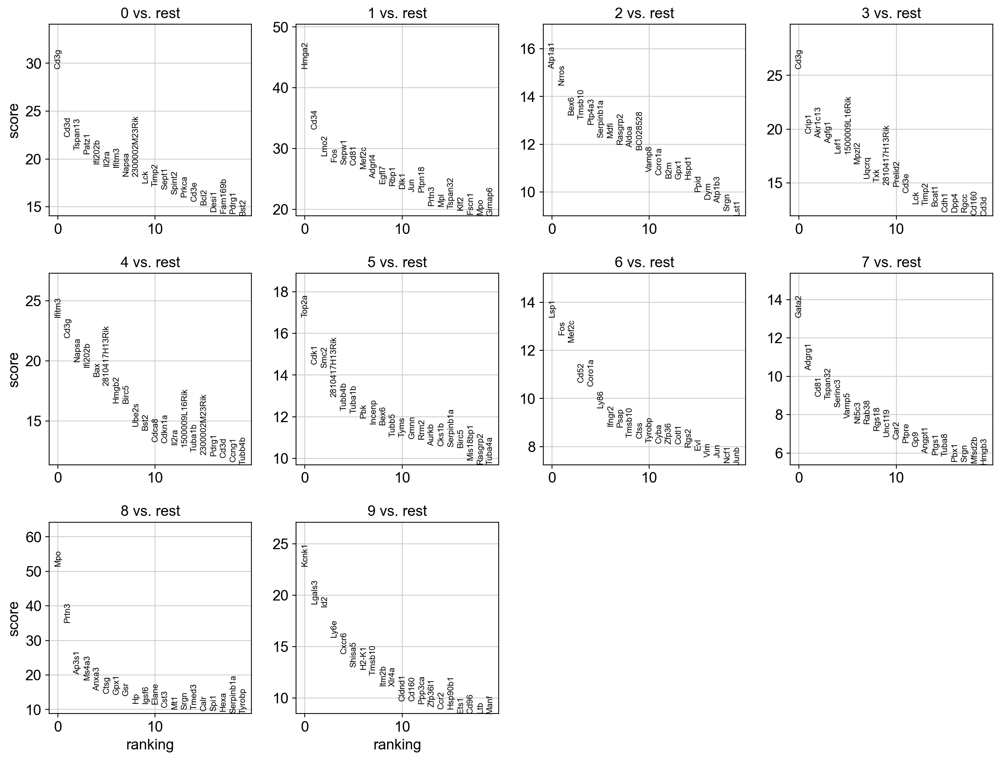

saving figure to file figures/umap_clusters.png


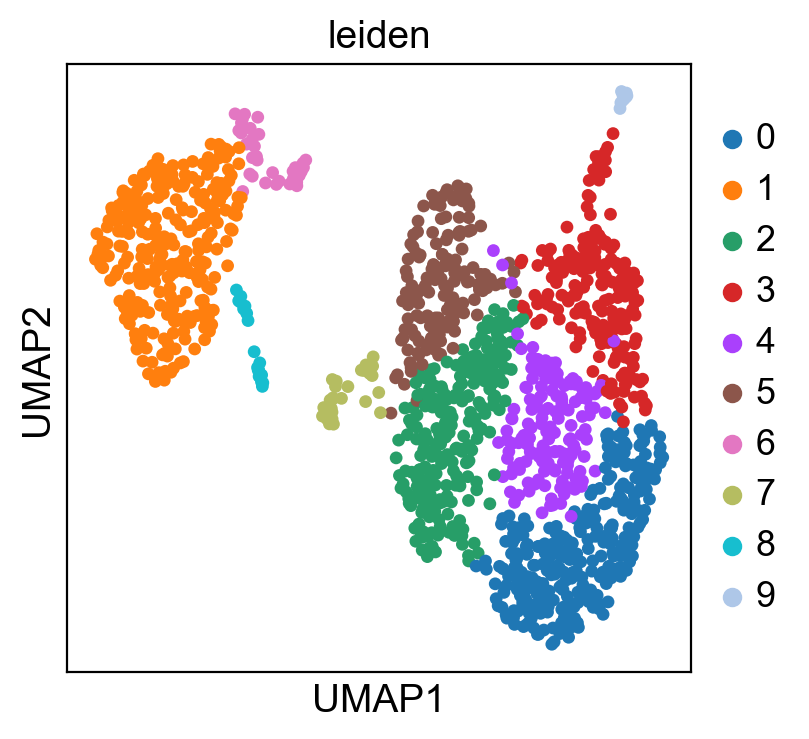

✅ Pipeline complete! Saved to:
 - processed_data.h5ad
 - marker_genes.csv


In [4]:
# 📦 Imports
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt

# 🔧 Scanpy settings (optional)
sc.settings.verbosity = 3
sc.set_figure_params(dpi=100, facecolor='white')

# 📁 Path to your 10x files
data_dir = "Untitled Folder 3/"  # Replace with your path

# 📥 Load 10x Genomics data
adata = sc.read_10x_mtx(
    data_dir,
    var_names='gene_symbols',  # Or 'gene_ids' if you prefer
    cache=True
)

print(f"✅ Loaded data: {adata.shape} (cells, genes)")

# 🧼 1. Basic QC Metrics
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

# Annotate mitochondrial genes
adata.var['mt'] = adata.var_names.str.upper().str.startswith('MT-')
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

# 📊 Visualize QC metrics before filtering
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

# 🧼 2. Filter based on thresholds
print("🔎 Before filtering:", adata.shape)

# Adjust these as needed based on the plots
adata = adata[adata.obs.n_genes_by_counts < 6000, :]
adata = adata[adata.obs.n_genes_by_counts > 300, :]
adata = adata[adata.obs.pct_counts_mt < 20, :]

print("✅ After filtering:", adata.shape)

# Stop early if filtering removed all cells
if adata.n_obs == 0:
    raise ValueError("❌ All cells were removed during filtering. Please adjust thresholds.")

# 🧪 3. Normalize & Log-transform
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

# 🔍 4. Find Highly Variable Genes
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
adata = adata[:, adata.var.highly_variable]

# 🔬 5. Scale and PCA
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack')
sc.pl.pca(adata)  # Optional: change gene

# 🤝 6. Neighbors + UMAP
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata)

# 🔖 7. Clustering
sc.tl.leiden(adata, resolution=0.5)
sc.pl.umap(adata, color=['leiden'])

# 🧬 8. Marker Gene Discovery
sc.tl.rank_genes_groups(adata, 'leiden', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False)

# 📤 9. Save Results
adata.write("processed_data.h5ad")
marker_df = sc.get.rank_genes_groups_df(adata, group=None)
marker_df.to_csv("marker_genes.csv", index=False)

# Optional: Save UMAP with clusters
sc.pl.umap(adata, color=['leiden'], save="_clusters.png")

print("✅ Pipeline complete! Saved to:")
print(" - processed_data.h5ad")
print(" - marker_genes.csv")


In [4]:
# Step 1: Build graph (Scanpy or custom)
# Step 2: Train GNN to embed state
# Step 3: Create Gym-style environment for cell fate transitions
# Step 4: Train RL agent with GNN-based policy


#scRNA-seq data → Gene Expression Matrix → GRN Inference (SCENIC / GRNBoost)
#         ↓
#    Graph: Genes = nodes, regulation = edges
#         ↓
#    GNN → encodes current cell state from GRN
#         ↓
#RL Agent (PPO, A2C, etc.)
 #        ↓
# Selects action (TF activation, perturbation)
  #       ↓
#Environment simulates cell transition → Next GRN-encoded state


In [8]:
# Install dependencies if needed (Uncomment in Colab)
# !pip install scanpy torch torchvision torchaudio torch-geometric stable-baselines3 sb3-contrib

import scanpy as sc
import numpy as np
import torch
import gym
from gym import spaces
from torch_geometric.data import Data
from torch_geometric.nn import GCNConv
from stable_baselines3 import PPO
from stable_baselines3 import PPO
from sb3_contrib import TRPO
from stable_baselines3.common.vec_env import DummyVecEnv
import matplotlib.pyplot as plt
import os

# Step 1: Load and preprocess real scRNA-seq data
adata = sc.read_10x_mtx("Untitled Folder 3/")
sc.pp.filter_cells(adata, min_genes=500)
sc.pp.filter_genes(adata, min_cells=20)
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata)
adata = adata[:, adata.var.highly_variable]
sc.pp.scale(adata, max_value=10)
sc.pp.pca(adata)
sc.pp.neighbors(adata, n_neighbors=10)

# Step 2: Construct graph for PyTorch Geometric
# Step 2: Construct graph for PyTorch Geometric
edges = adata.obsp['connectivities'].tocoo()
edge_index = torch.tensor([edges.row, edges.col], dtype=torch.long)
x = torch.tensor(adata.X, dtype=torch.float)
graph_data = Data(x=x, edge_index=edge_index)

# Define gene names list for later use
gene_names = adata.var_names.tolist()

# Step 3: Define GNN
class CellGNN(torch.nn.Module):
    def __init__(self, in_channels, hidden_channels=64, out_channels=32):
        super().__init__()
        self.conv1 = GCNConv(in_channels, hidden_channels)
        self.conv2 = GCNConv(hidden_channels, out_channels)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index).relu()
        x = self.conv2(x, edge_index)
        return x

model = CellGNN(in_channels=x.shape[1])
model.eval()
with torch.no_grad():
    embeddings = model(graph_data).numpy()

# Dummy labels (replace with real if available)
if 'true_label' not in adata.obs:
    adata.obs['true_label'] = np.random.randint(0, 3, size=(adata.shape[0],))
labels = adata.obs['true_label'].values

import numpy as np

import numbers
import numpy as np

def simulate_crispr(raw_expr_vec, knockout_gene_idx=None, severity=0.8):
    perturbed = raw_expr_vec.copy()
    if knockout_gene_idx is not None:
        # Convert 0-d numpy array to python int
        if isinstance(knockout_gene_idx, np.ndarray) and knockout_gene_idx.ndim == 0:
            knockout_gene_idx = knockout_gene_idx.item()
        
        if isinstance(knockout_gene_idx, numbers.Integral) or np.isscalar(knockout_gene_idx):
            knockout_gene_idx = [int(knockout_gene_idx)]
        for idx in knockout_gene_idx:
            perturbed[..., idx] *= (1 - severity)
    
    noise = np.random.normal(0, 0.01, size=perturbed.shape)
    perturbed += noise
    perturbed = np.clip(perturbed, 0, None)
    return perturbed


# Step 5: Define custom Gym environment
# Step 3: Define Gym Environment

class GRNEnv(gym.Env):
    def __init__(self, x, labels, gene_names, perturb=True):
        super(GRNEnv, self).__init__()
        self.x = x  # cell embeddings (numpy array or torch tensor)
        self.labels = labels  # 1D array of class labels
        self.gene_names = gene_names  # List of gene names corresponding to features
        self.perturb = perturb

        self.n_nodes = x.shape[0]
        self.n_features = x.shape[1]
        self.n_classes = len(np.unique(labels))
        self.idx = 0  # current cell index

        # Observation space is continuous vector of length = number of features
        self.observation_space = spaces.Box(low=-np.inf, high=np.inf, shape=(self.n_features,), dtype=np.float32)
        
        # Action space: currently set to number of classes (e.g., cell types or labels)
        self.action_space = spaces.Discrete(self.n_classes)

    def reset(self):
        # Sample a random cell index
        self.idx = np.random.randint(0, self.n_nodes)
        obs = self.x[self.idx]

        if self.perturb:
            # Example: perturb cell expression embedding by simulating CRISPR knockout
            obs = simulate_crispr(obs)

        return obs.astype(np.float32)

    def step(self, action):
        # Retrieve true label for current cell
        true_label = self.labels[self.idx]

        # Reward: +1 if action matches true label, else -1
        reward = 1.0 if action == true_label else -1.0

        done = True  # One-step episode

        obs = self.x[self.idx]  # next observation (unchanged here)

        info = {"true_label": int(true_label)}

        return obs.astype(np.float32), reward, done, info

    def get_gene_name(self, action_idx):
        # Return gene name for a given action index (assuming action indexes genes)
        return self.gene_names[action_idx]


# Step 6: Train with PPO
#env = DummyVecEnv([lambda: GRNEnv(embeddings, labels, gene_names, perturb=True)])



#agent = PPO("MlpPolicy", env,
 #           learning_rate=3e-4,
  #          gamma=0.99,
   #         gae_lambda=0.95,
    #        n_steps=2048,
    #        ent_coef=0.01,
    #        clip_range=0.2,
     #       vf_coef=0.5,
      #      batch_size=64,
       #     n_epochs=10,
        #    verbose=1)
#agent.learn(total_timesteps=50000)


from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score
import numpy as np

def evaluate(agent, n_episodes=1000, n_classes=None, verbose=True):
    env_eval = GRNEnv(embeddings, labels, gene_names, perturb=True)

    y_true = []
    y_pred = []
    y_prob = []

    for _ in range(n_episodes):
        obs = env_eval.reset()
        action, _states = agent.predict(obs, deterministic=False)

        # Optional: Get action probabilities if available
        # Most SB3 models have policy object: agent.policy.predict_values or ._predict
        # For now, we assume discrete action
        dist = agent.policy.get_distribution(agent.policy.obs_to_tensor(obs)[0])
        probs = dist.distribution.probs.detach().cpu().numpy()

        y_pred.append(int(action))
        y_true.append(int(env_eval.labels[env_eval.idx]))
        y_prob.append(probs[0])  # probs[0] if batch size is 1

    # Metrics
    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, average='weighted', zero_division=0)
    rec = recall_score(y_true, y_pred, average='weighted', zero_division=0)
    f1 = f1_score(y_true, y_pred, average='weighted', zero_division=0)
    cm = confusion_matrix(y_true, y_pred)

    # AUROC
    y_true_onehot = np.eye(n_classes)[y_true] if n_classes else np.eye(len(set(y_true)))[y_true]
    try:
        auroc = roc_auc_score(y_true_onehot, np.array(y_prob), multi_class='ovr')
    except:
        auroc = None

    if verbose:
        print(f"📊 Evaluation over {n_episodes} episodes:")
        print(f"✅ Accuracy:  {acc:.4f}")
        print(f"🎯 Precision: {prec:.4f}")
        print(f"📥 Recall:    {rec:.4f}")
        print(f"📈 F1 Score:  {f1:.4f}")
        print(f"🔵 AUROC:     {auroc:.4f}" if auroc is not None else "🔴 AUROC: could not be computed")
        print(f"🧾 Confusion Matrix:\n{cm}")

    return {
        "accuracy": acc,
        "precision": prec,
        "recall": rec,
        "f1": f1,
        "auroc": auroc,
        "confusion_matrix": cm,
        "true_labels": y_true,
        "predicted_labels": y_pred
    }



    
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
import warnings

def evaluate_dqn(model,  n_episodes=1000, verbose=True):
    y_true = []
    y_pred = []
    env = GRNEnv(embeddings, labels, gene_names, perturb=True)
    for _ in range(n_episodes):
        obs = env.reset()
        done = False
        while not done:
            action, _ = model.predict(obs, deterministic=False)
            obs, reward, done, info = env.step(action)

            # Assuming the environment provides true label via `info['true_label']`
            # Otherwise, replace this with env.y or a custom env method like env.get_true_label()
            if isinstance(info, list):
                label = info[0].get('true_label')
            else:
                label = info.get('true_label')

            y_true.append(label)
            y_pred.append(int(action))

    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, average="weighted", zero_division=0)
    rec = recall_score(y_true, y_pred, average="weighted", zero_division=0)
    f1 = f1_score(y_true, y_pred, average="weighted", zero_division=0)
    cm = confusion_matrix(y_true, y_pred)

    # AUROC: Only if >1 class in y_true
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        try:
            auroc = roc_auc_score(y_true, y_pred, multi_class="ovo", average="weighted")
        except:
            auroc = None

    if verbose:
        print(f"📊 Evaluation over {n_episodes} episodes:")
        print(f"✅ Accuracy:  {acc:.4f}")
        print(f"🎯 Precision: {prec:.4f}")
        print(f"📥 Recall:    {rec:.4f}")
        print(f"📈 F1 Score:  {f1:.4f}")
        print(f"🔵 AUROC:     {auroc:.4f}" if auroc is not None else "🔴 AUROC: could not be computed")
        print(f"🧾 Confusion Matrix:\n{cm}")

    return {
        "accuracy": acc,
        "precision": prec,
        "recall": rec,
        "f1": f1,
        "auroc": auroc,
        "confusion_matrix": cm,
        "true_labels": y_true.tolist(),
        "predicted_labels": y_pred.tolist()
    }







from stable_baselines3 import PPO, A2C
from stable_baselines3.common.vec_env import DummyVecEnv
import os


from sb3_contrib import QRDQN
from stable_baselines3.common.env_util import DummyVecEnv

# Make sure your action_space in GRNEnv is of type: gym.spaces.Discrete
dqn_env = DummyVecEnv([lambda: GRNEnv(embeddings, labels, gene_names, perturb=True)])

# Instantiate and train
dqn_model = QRDQN("MlpPolicy", dqn_env, verbose=1)
dqn_model.learn(total_timesteps=50000)
dqn_model.save("dqn_model")
dqn_model_metrics = evaluate_dqn(dqn_model)



# Create PPO model and train
ppo_env = DummyVecEnv([lambda: GRNEnv(embeddings, labels, gene_names, perturb=True)])
ppo_model = PPO("MlpPolicy", ppo_env, verbose=1)
ppo_model.learn(total_timesteps=50000)
ppo_model.save("ppo_model")
# Evaluate PPO
print("\n--- Evaluating PPO ---")
ppo_metrics = evaluate(ppo_model)

# Transfer to A2C and continue training
print("\n--- Transferring PPO weights to A2C ---")

env_trpo = DummyVecEnv([lambda: GRNEnv(embeddings, labels, gene_names, perturb=True)])

# --- Step 2: Train TRPO model
trpo_model = TRPO("MlpPolicy", env_trpo, verbose=1)
trpo_model.learn(total_timesteps=25000)
trpo_model.save("trpo_model_GRN")

# --- Step 3: Create PPO environment (should be the same or similar)
env_ppo = DummyVecEnv([lambda: GRNEnv(embeddings, labels, gene_names, perturb=True)])

# --- Step 4: Load PPO and transfer weights from TRPO
ppo_model_from_trpo = PPO("MlpPolicy", env_ppo, verbose=1)
ppo_model_from_trpo.policy.load_state_dict(trpo_model.policy.state_dict())

# --- Step 5: Fine-tune with PPO
ppo_model_from_trpo.learn(total_timesteps=25000)
ppo_model_from_trpo.save("ppo_from_trpo_model")



# Evaluate Transferred A2C
print("\n--- Evaluating PPO (from TPRO) ---")
ppo_model_from_trpo_metrics = evaluate(ppo_model_from_trpo)

a2c_env = DummyVecEnv([lambda: GRNEnv(embeddings, labels, gene_names, perturb=True)])

# Train A2C from scratch for comparison
a2c_fresh_model = A2C("MlpPolicy", a2c_env, verbose=1)
a2c_fresh_model.learn(total_timesteps=50000)
a2c_fresh_model.save("a2c_fresh_model")

# Evaluate A2C trained from scratch
print("\n--- Evaluating A2C (Fresh) ---")
a2c_fresh_metrics = evaluate(a2c_fresh_model)





# Compare all three models
print("\n=== Summary of Performance ===")
print("PPO:")
for k, v in ppo_metrics.items():
    if isinstance(v, (int, float)):
        print(f"  {k}: {v:.4f}")

print("\PPO (from TPRO):")
for k, v in ppo_model_from_trpo_metrics.items():
    if isinstance(v, (int, float)):
        print(f"  {k}: {v:.4f}")

print("\nA2C:")
for k, v in a2c_fresh_metrics.items():
    if isinstance(v, (int, float)):
        print(f"  {k}: {v:.4f}")

print("\dqn:")
for k, v in dqn_model_metrics.items():
    if isinstance(v, (int, float)):
        print(f"  {k}: {v:.4f}")




# Save agent
#os.makedirs("checkpoints", exist_ok=True)
#agent.save("checkpoints/cell_policy_ppo")


#

/Users/boabangfrancis/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_scale.py:309: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/Users/boabangfrancis/anaconda3/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


Using cpu device
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.984    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 3442     |
|    time_elapsed     | 0        |
|    total_timesteps  | 4        |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.968    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 3110     |
|    time_elapsed     | 0        |
|    total_timesteps  | 8        |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.952    |
| time/               |          |
|    episodes         | 12       |
|    fps              | 3166     |
|    time_elapsed     | 0        |
|    total_timesteps  | 12       |
----------------------------------
----------------------------------
| r

/Users/boabangfrancis/anaconda3/lib/python3.11/site-packages/stable_baselines3/common/vec_env/patch_gym.py:49: UserWarning: You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.
  warnings.warn(


----------------------------------
| rollout/            |          |
|    exploration_rate | 0.493    |
| time/               |          |
|    episodes         | 128      |
|    fps              | 646      |
|    time_elapsed     | 0        |
|    total_timesteps  | 128      |
| train/              |          |
|    learning_rate    | 5e-05    |
|    loss             | 50.2     |
|    n_updates        | 6        |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.477    |
| time/               |          |
|    episodes         | 132      |
|    fps              | 624      |
|    time_elapsed     | 0        |
|    total_timesteps  | 132      |
| train/              |          |
|    learning_rate    | 5e-05    |
|    loss             | 50.4     |
|    n_updates        | 7        |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rat

/Users/boabangfrancis/anaconda3/lib/python3.11/site-packages/stable_baselines3/common/vec_env/patch_gym.py:49: UserWarning: You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.
  warnings.warn(


-----------------------------
| time/              |      |
|    fps             | 6012 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 2048 |
-----------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 4065        |
|    iterations           | 2           |
|    time_elapsed         | 1           |
|    total_timesteps      | 4096        |
| train/                  |             |
|    approx_kl            | 0.008354694 |
|    clip_fraction        | 0.0326      |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.09       |
|    explained_variance   | -0.0449     |
|    learning_rate        | 0.0003      |
|    loss                 | 0.414       |
|    n_updates            | 10          |
|    policy_gradient_loss | -0.00807    |
|    value_loss           | 0.924       |
-----------------------------------------
----------------------------------

/Users/boabangfrancis/anaconda3/lib/python3.11/site-packages/stable_baselines3/common/vec_env/patch_gym.py:49: UserWarning: You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.
  warnings.warn(


-----------------------------
| time/              |      |
|    fps             | 6152 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 2048 |
-----------------------------
----------------------------------------
| time/                     |          |
|    fps                    | 5196     |
|    iterations             | 2        |
|    time_elapsed           | 0        |
|    total_timesteps        | 4096     |
| train/                    |          |
|    explained_variance     | -0.0761  |
|    is_line_search_success | 1        |
|    kl_divergence_loss     | 0.0042   |
|    learning_rate          | 0.001    |
|    n_updates              | 1        |
|    policy_objective       | 0.0148   |
|    value_loss             | 0.892    |
----------------------------------------
----------------------------------------
| time/                     |          |
|    fps                    | 4988     |
|    iterations             | 3        |
|    time_e

/Users/boabangfrancis/anaconda3/lib/python3.11/site-packages/stable_baselines3/common/vec_env/patch_gym.py:49: UserWarning: You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.
  warnings.warn(


------------------------------------
| time/                 |          |
|    fps                | 2679     |
|    iterations         | 200      |
|    time_elapsed       | 0        |
|    total_timesteps    | 1000     |
| train/                |          |
|    entropy_loss       | -1.03    |
|    explained_variance | 0.0422   |
|    learning_rate      | 0.0007   |
|    n_updates          | 199      |
|    policy_loss        | 0.584    |
|    value_loss         | 1.04     |
------------------------------------
------------------------------------
| time/                 |          |
|    fps                | 2641     |
|    iterations         | 300      |
|    time_elapsed       | 0        |
|    total_timesteps    | 1500     |
| train/                |          |
|    entropy_loss       | -1.08    |
|    explained_variance | -0.147   |
|    learning_rate      | 0.0007   |
|    n_updates          | 299      |
|    policy_loss        | 1.04     |
|    value_loss         | 1.71     |
-

/Users/boabangfrancis/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_pca/__init__.py:383: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = X_pca



--- Training PPO ---


/Users/boabangfrancis/anaconda3/lib/python3.11/site-packages/stable_baselines3/common/vec_env/patch_gym.py:49: UserWarning: You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.
  warnings.warn(
/Users/boabangfrancis/anaconda3/lib/python3.11/site-packages/stable_baselines3/common/vec_env/patch_gym.py:49: UserWarning: You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.
  warnings.warn(
/Users/boabangfrancis/anaconda3/lib/python3.11/site-packages/stable_baselines3/common/vec_env/patch_gym.py:49: UserWarning: You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automaticall

Using cpu device
-----------------------------
| time/              |      |
|    fps             | 6776 |
|    iterations      | 1    |
|    time_elapsed    | 1    |
|    total_timesteps | 8192 |
-----------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 725         |
|    iterations           | 2           |
|    time_elapsed         | 22          |
|    total_timesteps      | 16384       |
| train/                  |             |
|    approx_kl            | 0.009855919 |
|    clip_fraction        | 0.0751      |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.99       |
|    explained_variance   | -0.00327    |
|    learning_rate        | 0.0001      |
|    loss                 | 6.8         |
|    n_updates            | 50          |
|    policy_gradient_loss | -0.00796    |
|    value_loss           | 24          |
-----------------------------------------
-----------------

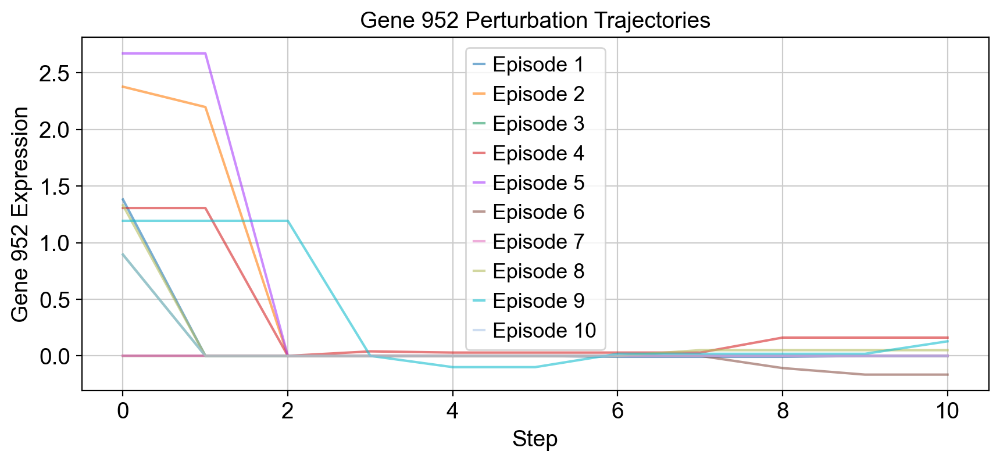


--- Evaluation Results for Gene 713 (local idx 1) ---
Accuracy:  0.5482
Precision: 0.7911
Recall:    0.5482
F1 Score:  0.6156


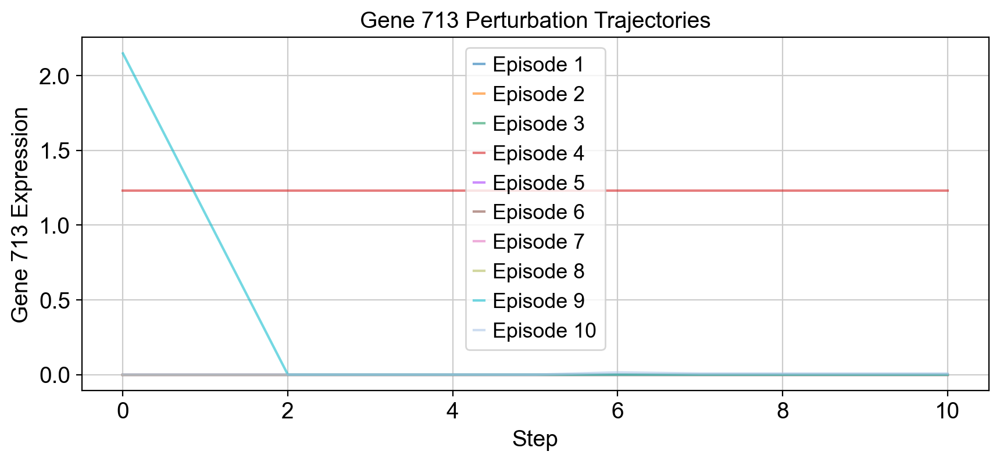


--- Evaluation Results for Gene 839 (local idx 2) ---
Accuracy:  0.5262
Precision: 0.5800
Recall:    0.5262
F1 Score:  0.5216


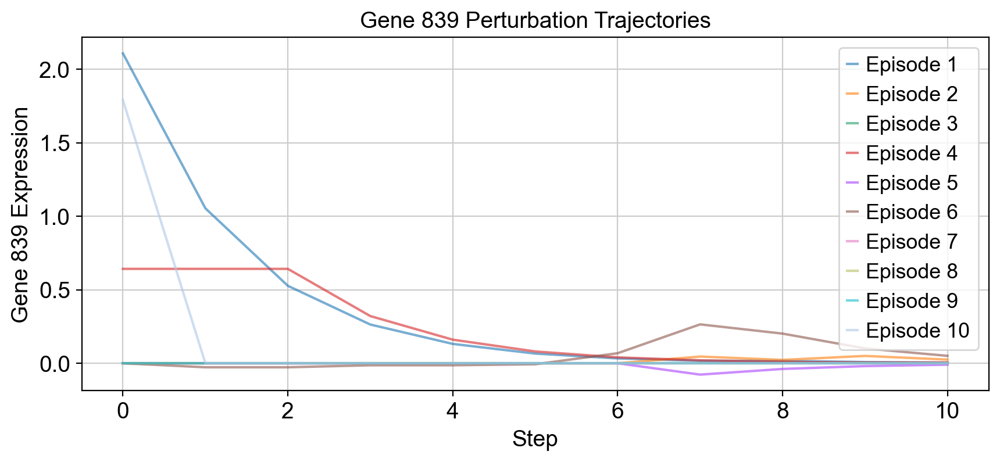


--- Evaluation Results for Gene 840 (local idx 3) ---
Accuracy:  0.4702
Precision: 0.5775
Recall:    0.4702
F1 Score:  0.4068


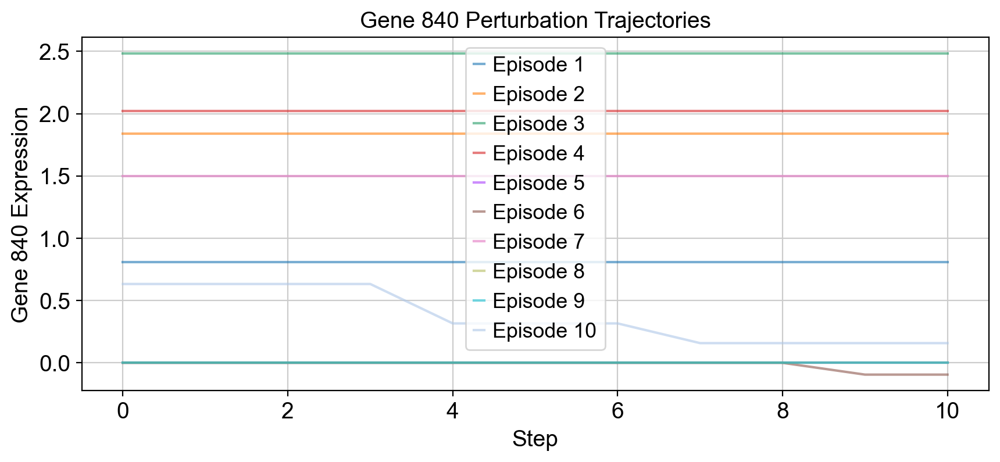


--- Evaluation Results for Gene 409 (local idx 4) ---
Accuracy:  0.5399
Precision: 0.5848
Recall:    0.5399
F1 Score:  0.5365


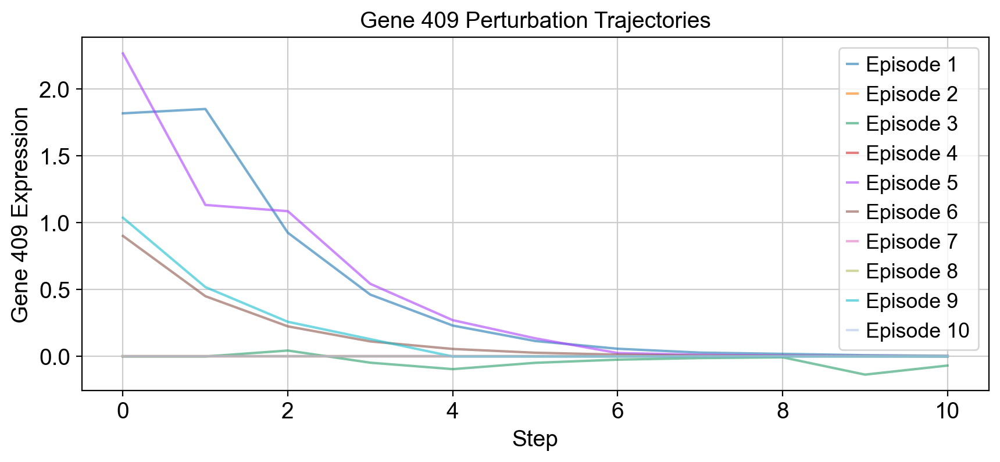


--- Evaluation Results for Gene 357 (local idx 5) ---
Accuracy:  0.4413
Precision: 0.6811
Recall:    0.4413
F1 Score:  0.4115


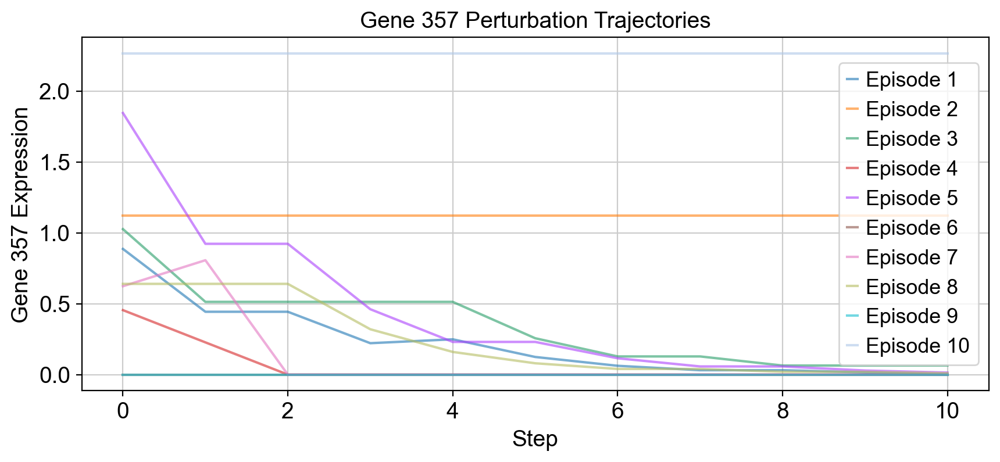


--- Evaluation Results for Gene 90 (local idx 6) ---
Accuracy:  0.5880
Precision: 0.7965
Recall:    0.5880
F1 Score:  0.6599


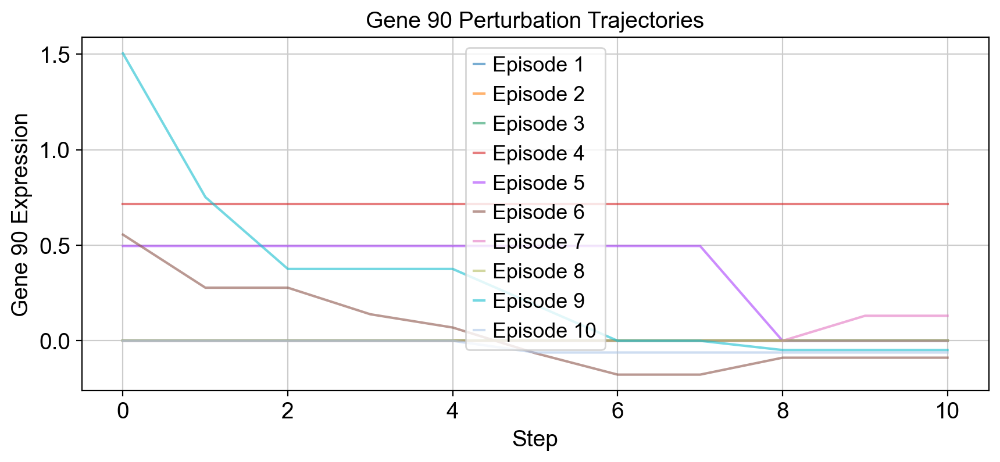


--- Evaluation Results for Gene 1036 (local idx 7) ---
Accuracy:  0.4462
Precision: 0.8481
Recall:    0.4462
F1 Score:  0.5697


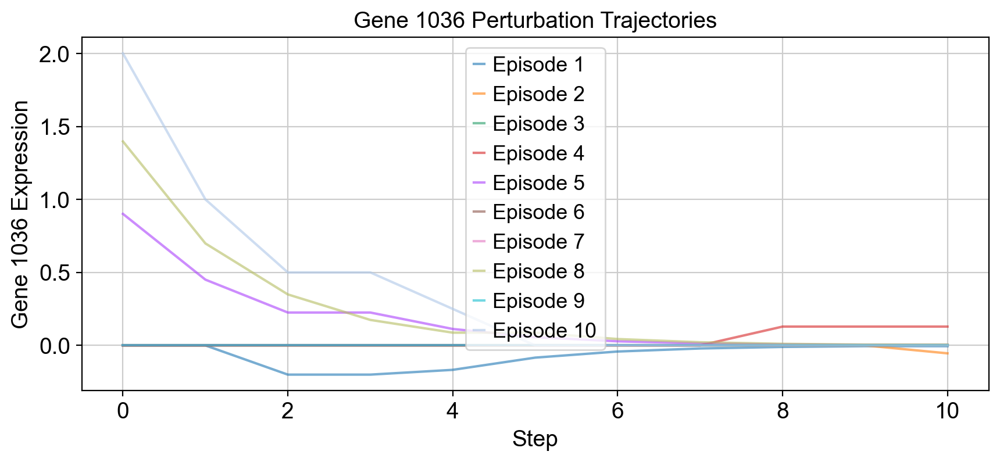


--- Evaluation Results for Gene 990 (local idx 8) ---
Accuracy:  0.4878
Precision: 0.6513
Recall:    0.4878
F1 Score:  0.4635


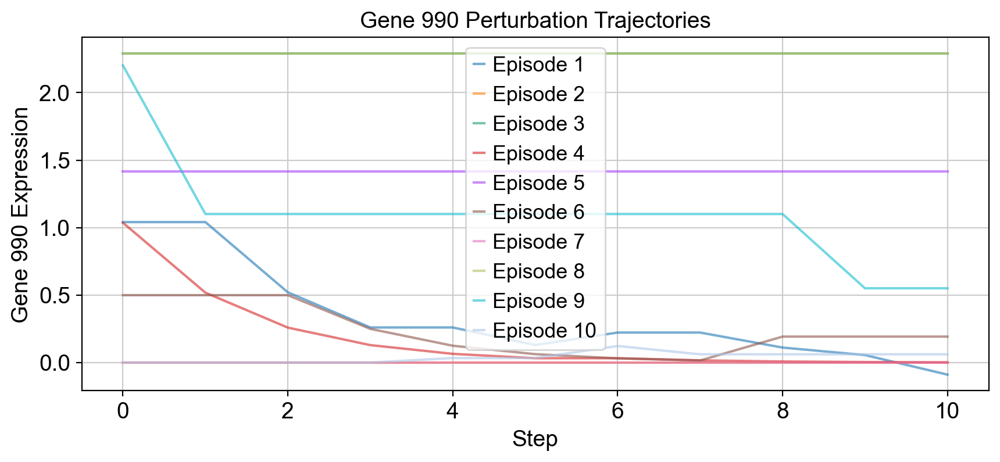


--- Evaluation Results for Gene 838 (local idx 9) ---
Accuracy:  0.4769
Precision: 0.6270
Recall:    0.4769
F1 Score:  0.4603


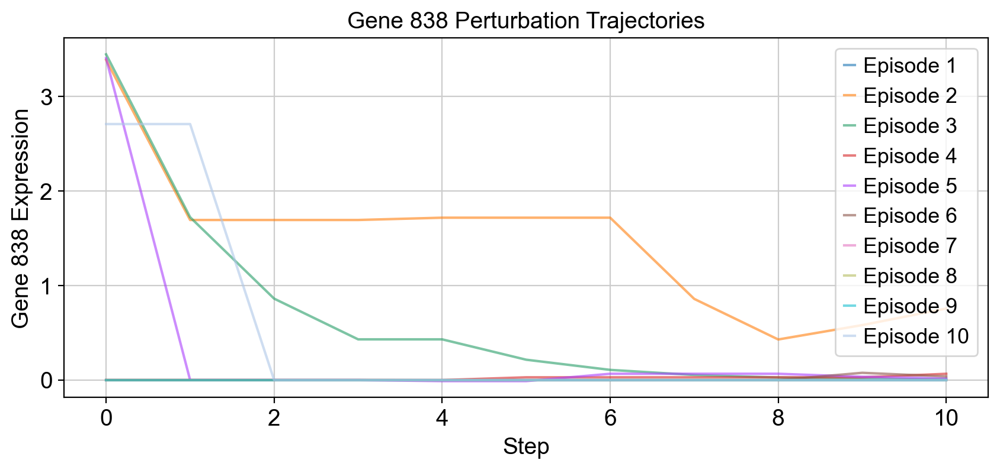

In [115]:
# --- Imports ---
import scanpy as sc
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import gym
from gym import spaces
from stable_baselines3 import PPO
from stable_baselines3.common.vec_env import SubprocVecEnv
from scipy.sparse import issparse
from torch_geometric.nn import GCNConv
from torch_geometric.utils import dense_to_sparse
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.feature_selection import mutual_info_regression
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

# --- Step 1: Load & preprocess scRNA-seq data ---
adata = sc.read_10x_mtx("Untitled Folder 3/")
sc.pp.filter_cells(adata, min_genes=1000)
sc.pp.filter_genes(adata, min_cells=50)
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata)
adata = adata[:, adata.var.highly_variable]
sc.tl.pca(adata)

# --- Step 2: Pseudotime inference (DPT) ---
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=30)
sc.tl.diffmap(adata)
adata.uns['iroot'] = 0
sc.tl.dpt(adata)
pseudotime = adata.obs['dpt_pseudotime'].values

# --- Step 3: Gene selection via mutual information ---
X = adata.X.toarray() if issparse(adata.X) else adata.X
adata.X = X
y = pseudotime
mi_scores = mutual_info_regression(X, y, discrete_features=False)
N = 10
top_gene_indices = np.argsort(mi_scores)[-N:]
X = X[:, top_gene_indices]
adata = adata[:, top_gene_indices]

# --- Step 4: Adjacency matrix (Pearson + pseudotime precedence) ---
corr_matrix = np.corrcoef(X.T)
precedence = np.argsort(pseudotime)
adj_matrix = np.zeros_like(corr_matrix)
for i in range(N):
    for j in range(N):
        if i != j and precedence[i] < precedence[j] and abs(corr_matrix[i, j]) > 0.3:
            adj_matrix[i, j] = 1

adj_tensor = torch.tensor(adj_matrix, dtype=torch.float32)
edge_index, _ = dense_to_sparse(adj_tensor)

# --- Step 5: Train/test split ---
n_cells = X.shape[0]
train_idx = np.random.choice(n_cells, int(0.8 * n_cells), replace=False)
test_idx = np.setdiff1d(np.arange(n_cells), train_idx)
expression_train = X[train_idx]
expression_test = X[test_idx]
pseudotime_train = pseudotime[train_idx]
pseudotime_test = pseudotime[test_idx]

# --- Step 6: GCN model ---
class GeneGCN(nn.Module):
    def __init__(self, in_dim=1, hidden_dim=32, out_dim=16):
        super().__init__()
        self.conv1 = GCNConv(in_dim, hidden_dim)
        self.conv2 = GCNConv(hidden_dim, out_dim)

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        x = self.conv2(x, edge_index)
        return x

gcn_model = GeneGCN()
gcn_model.eval()

# --- Step 7: RL Environment ---
class GRNEnv(gym.Env):
    def __init__(self, expression, adj_matrix, pseudotime, edge_index, gcn_model, max_steps=5):
        super().__init__()
        self.expression = expression
        self.adj_matrix = adj_matrix
        self.edge_index = edge_index
        self.gcn_model = gcn_model
        self.pseudotime = pseudotime
        self.n_cells, self.n_genes = expression.shape
        self.max_steps = max_steps
        self.action_space = spaces.Discrete(2 * self.n_genes)
        self.observation_space = spaces.Box(low=-10, high=10, shape=(self.n_genes, 16), dtype=np.float32)

    def reset(self):
        self.idx = np.random.randint(self.n_cells)
        self.current_cell = self.idx  # <--- Fix here
        self.state = self.expression[self.idx].copy()
        self.original_state = self.state.copy()
        eligible_idxs = np.where(self.pseudotime > self.pseudotime[self.idx])[0]
        if len(eligible_idxs) == 0:
            eligible_idxs = [self.idx]
        target_idx = np.random.choice(eligible_idxs)
        self.target = self.expression[target_idx]
        self.reward_gene = np.random.randint(self.n_genes)
        self.target_value = self.target[self.reward_gene]
        self.steps = 0
        self.history = [self.state.copy()]
        return self._get_observation()

    def _get_observation(self):
        x = torch.tensor(self.state, dtype=torch.float32).view(-1, 1)
        with torch.no_grad():
            out = self.gcn_model(x, self.edge_index).detach().numpy()
        return out.astype(np.float32)

    def step(self, action):
        gene = action // 2
        act_type = action % 2
        if act_type == 0:
            self.state[gene] = 0
        else:
            self.state[gene] += np.random.normal(loc=0.0, scale=0.1)
        for target_gene in range(self.n_genes):
            if self.adj_matrix[gene, target_gene] > 0:
                self.state[target_gene] *= 0.5
        self.steps += 1
        reward = -abs(self.state[self.reward_gene] - self.target_value)
        done = self.steps >= self.max_steps
        self.history.append(self.state.copy())
        return self._get_observation(), reward, done, {}

# --- Step 8: PPO Training ---
print("\n--- Training PPO ---")
train_env = SubprocVecEnv([
    lambda: GRNEnv(expression_train, adj_matrix, pseudotime_train, edge_index, gcn_model, max_steps=10)
    for _ in range(4)
])
model = PPO(
    "MlpPolicy",
    train_env,
    learning_rate=1e-4,
    n_steps=2048,
    batch_size=16,
    n_epochs=50,
    gamma=0.99,
    gae_lambda=0.95,
    clip_range=0.2,
    ent_coef=0.01,
    vf_coef=0.5,
    max_grad_norm=0.5,
    verbose=1
)
model.learn(total_timesteps=5000000)

# --- Step 9: Evaluation ---
def evaluate_all_genes(model, expression_test, adj_matrix, pseudotime_test, top_gene_indices, edge_index, gcn_model, n_episodes=100):
    results = {}
    all_perturbed_states = {gene_id: [] for gene_id in top_gene_indices}
    all_original_states = {gene_id: [] for gene_id in top_gene_indices}
    all_pseudotimes = []

    for local_idx in range(len(top_gene_indices)):
        y_true, y_pred = [], []
        gene_trajs = []

        for _ in range(n_episodes):
            env = GRNEnv(expression_test, adj_matrix, pseudotime_test, edge_index, gcn_model, max_steps=10)
            obs = env.reset()
            original = env.original_state
            target = env.target
            pseudotime_value = env.pseudotime[env.current_cell]

            done = False
            while not done:
                action, _ = model.predict(obs, deterministic=False)
                obs, _, done, _ = env.step(action)

            delta = obs[local_idx, :].mean() - original[local_idx]
            label = 1 if target[local_idx] > original[local_idx] else 0
            prediction = 1 if delta > 0 else 0

            y_true.append(label)
            y_pred.append(prediction)
            gene_trajs.append(np.array(env.history)[:, local_idx])

            gene_id = top_gene_indices[local_idx]
            all_perturbed_states[gene_id].append(obs[local_idx, :].mean())
            all_original_states[gene_id].append(original[local_idx])
            if local_idx == 0:
                all_pseudotimes.append(pseudotime_value)

        acc = accuracy_score(y_true, y_pred)
        prec = precision_score(y_true, y_pred, average='weighted', zero_division=0)
        rec = recall_score(y_true, y_pred, average='weighted', zero_division=0)
        f1 = f1_score(y_true, y_pred, average='weighted', zero_division=0)

        gene_id = top_gene_indices[local_idx]
        results[gene_id] = {
            "accuracy": acc,
            "precision": prec,
            "recall": rec,
            "f1_score": f1,
            "trajectories": gene_trajs[:10]
        }

        print(f"\n--- Evaluation Results for Gene {gene_id} (local idx {local_idx}) ---")
        print(f"Accuracy:  {acc:.4f}")
        print(f"Precision: {prec:.4f}")
        print(f"Recall:    {rec:.4f}")
        print(f"F1 Score:  {f1:.4f}")

        plt.figure(figsize=(10, 4))
        for traj in gene_trajs[:10]:
            plt.plot(traj, alpha=0.6)
        plt.xlabel("Step")
        plt.ylabel(f"Gene {gene_id} Expression")
        plt.title(f"Gene {gene_id} Perturbation Trajectories")
        plt.grid(True)
        plt.legend([f"Episode {i+1}" for i in range(len(gene_trajs[:10]))])
        plt.show()

    return results, all_perturbed_states, all_original_states, all_pseudotimes

results, all_perturbed_states, all_original_states, all_pseudotimes = evaluate_all_genes(
    model=model,
    expression_test=expression_test,
    adj_matrix=adj_matrix,
    pseudotime_test=pseudotime_test,
    top_gene_indices=top_gene_indices,
    edge_index=edge_index,
    gcn_model=gcn_model,
    n_episodes=10000
)




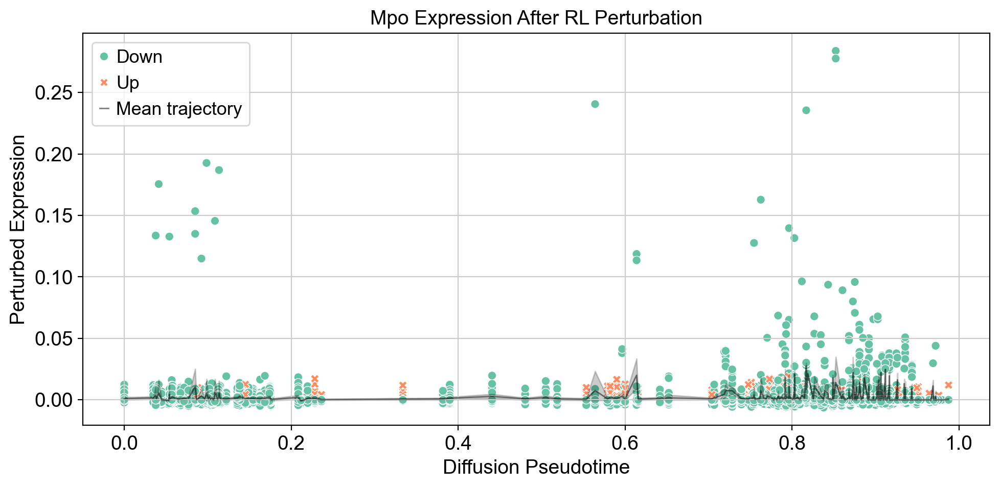

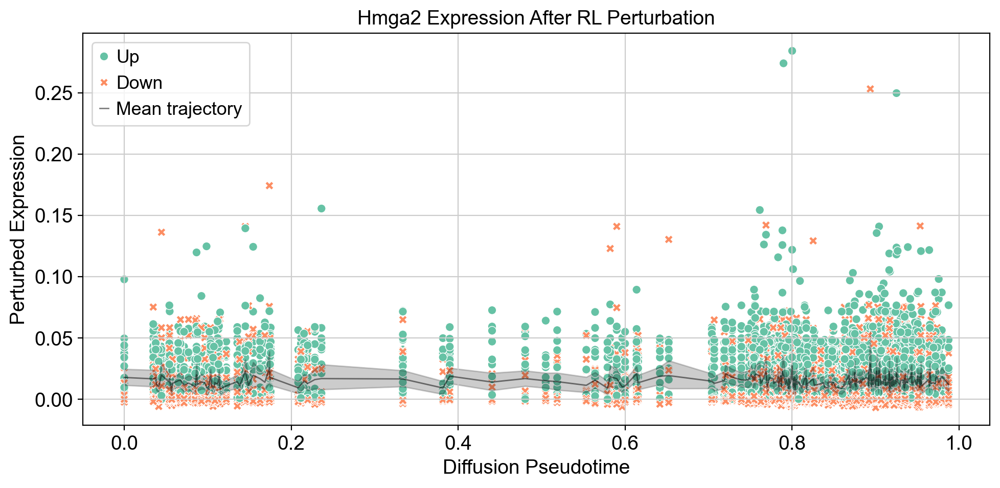

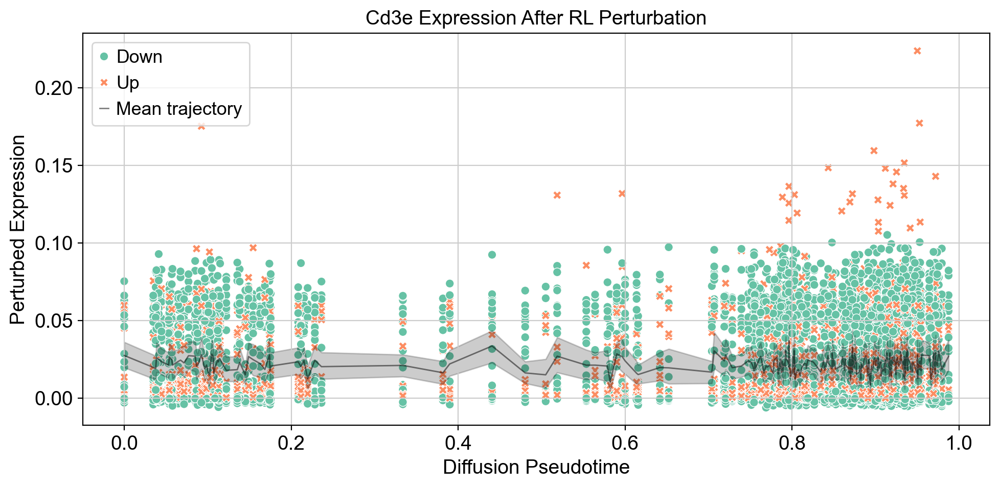

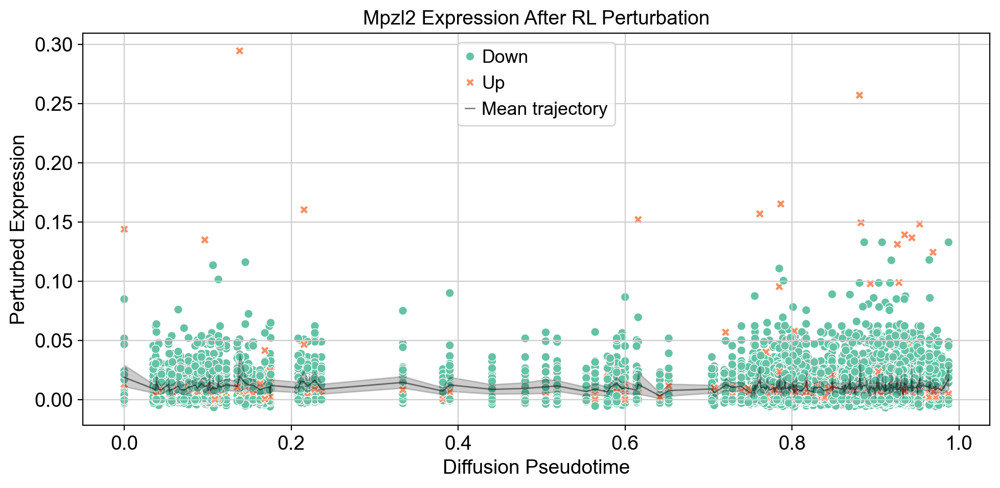

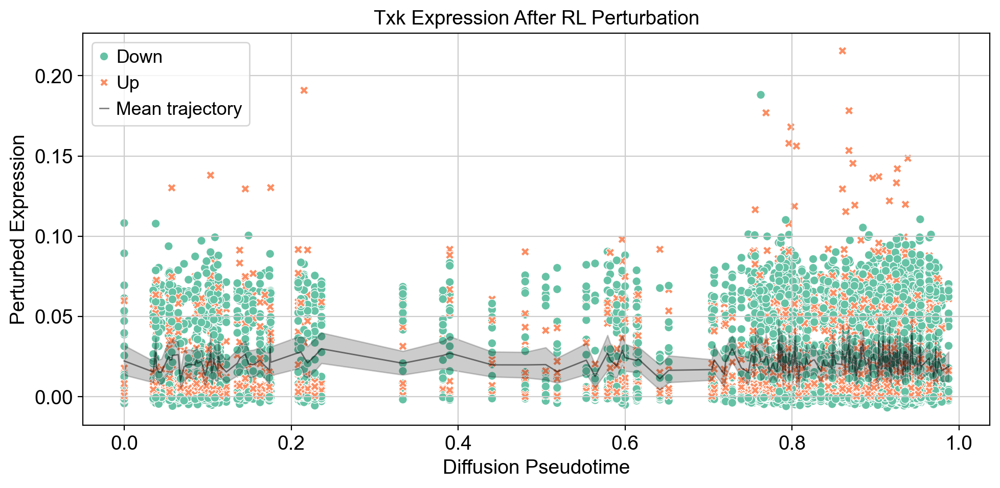

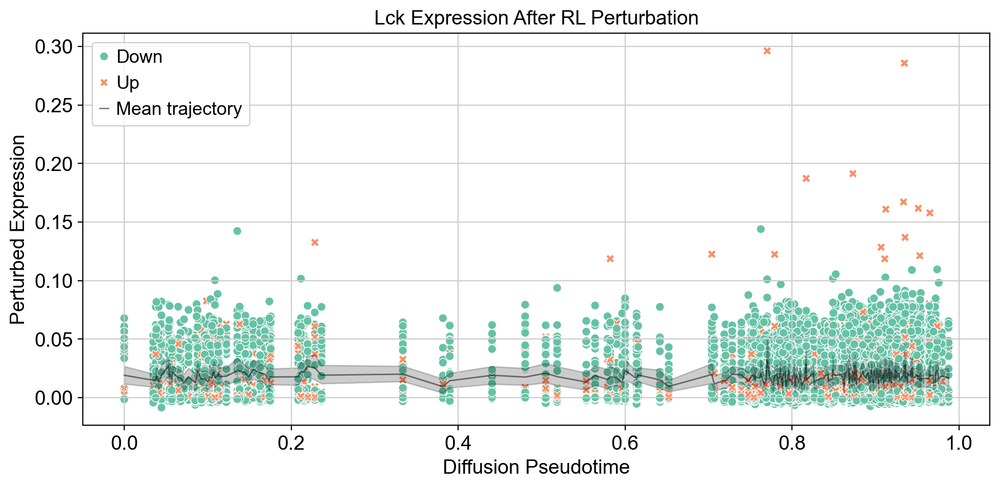

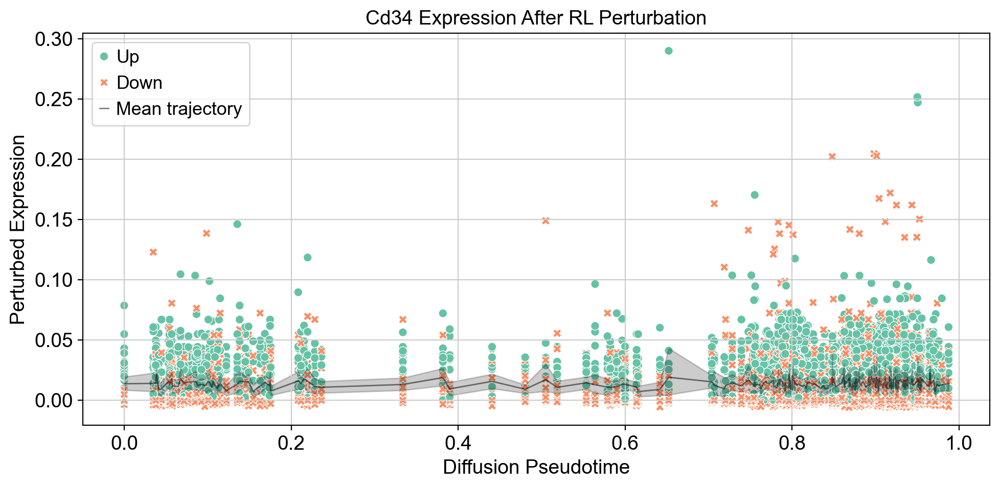

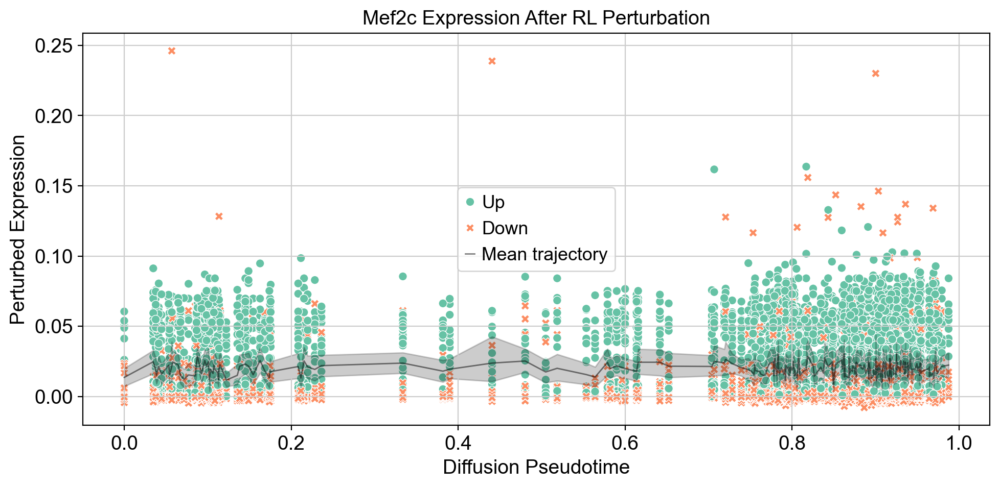

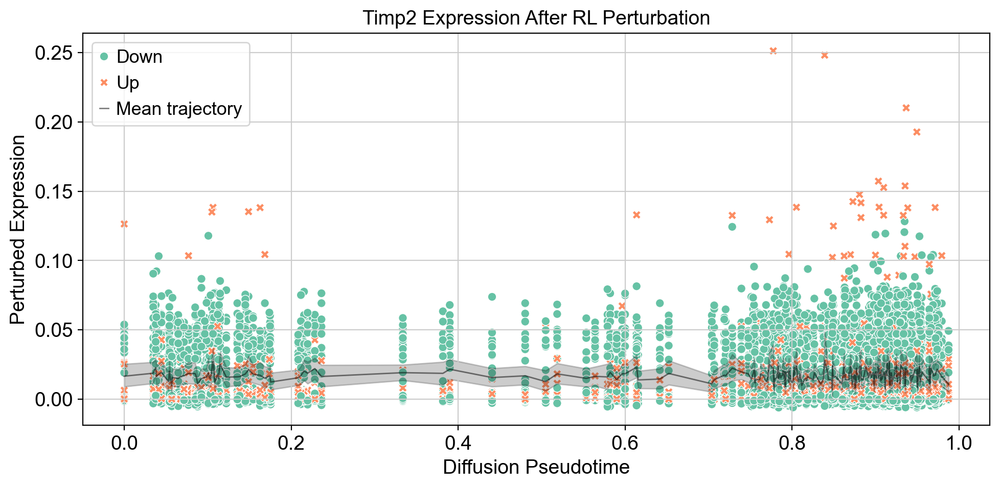

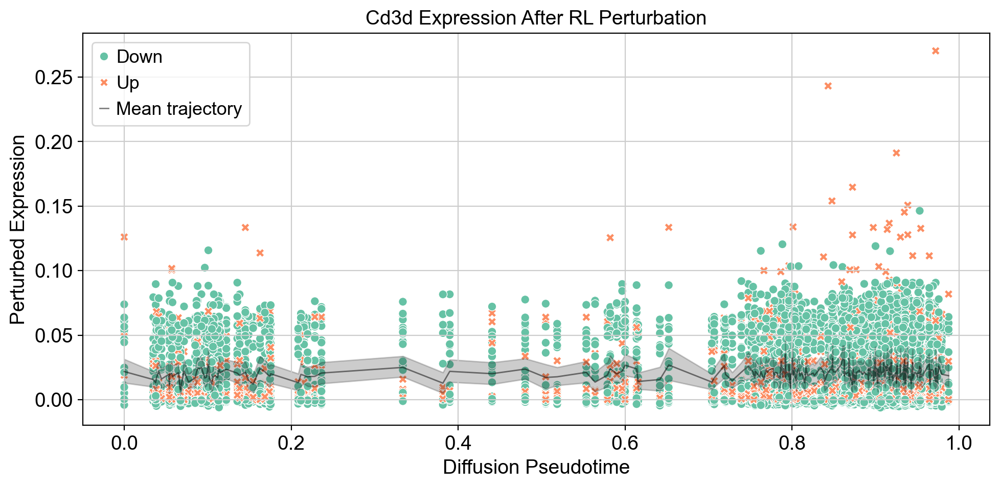

In [116]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# --- Step 10: Visualize perturbation along pseudotime ---
for gene_id in top_gene_indices:
    # Convert global gene_id to local index (within top_gene_indices)
    matches = np.where(top_gene_indices == gene_id)[0]
    if len(matches) == 0:
        print(f"Gene ID {gene_id} not found in top_gene_indices")
        continue
    local_gene_id = matches[0]
    gene_name = adata.var_names[local_gene_id]

    # Fetch original and perturbed states
    perturbed = all_perturbed_states[gene_id]
    original = all_original_states[gene_id]
    pseudotimes = all_pseudotimes

    # Create DataFrame for plotting
    df = pd.DataFrame({
        "pseudotime": pseudotimes,
        "original_expression": original,
        "perturbed_expression": perturbed
    })
    df['delta'] = df['perturbed_expression'] - df['original_expression']
    df['label'] = df['delta'].apply(lambda x: "Up" if x > 0 else "Down")

    # Plot
    plt.figure(figsize=(10, 5))
    sns.scatterplot(data=df, x="pseudotime", y="perturbed_expression", hue="label", style="label", palette="Set2")
    sns.lineplot(data=df.sort_values('pseudotime'), x="pseudotime", y="perturbed_expression", color='black', lw=1, alpha=0.5, label="Mean trajectory")
    plt.title(f"{gene_name} Expression After RL Perturbation")
    plt.xlabel("Diffusion Pseudotime")
    plt.ylabel("Perturbed Expression")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()